In [1]:
# Run this cell to mount your Google Drive.
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
!cp "/content/gdrive/My Drive/datasets/img_align_celeba.zip" "img_align_celeba.zip"

In [0]:
!cp "/content/gdrive/My Drive/datasets/anime_faces/data.zip" "data.zip"

##Extracting the dataset-**[Celeb-A](https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg)**

In [0]:
!unzip img_align_celeba.zip -d img_align_celeba;

Archive:  img_align_celeba.zip
   creating: img_align_celeba/img_align_celeba/
 extracting: img_align_celeba/img_align_celeba/000001.jpg  
 extracting: img_align_celeba/img_align_celeba/000002.jpg  
 extracting: img_align_celeba/img_align_celeba/000003.jpg  
 extracting: img_align_celeba/img_align_celeba/000004.jpg  
 extracting: img_align_celeba/img_align_celeba/000005.jpg  
 extracting: img_align_celeba/img_align_celeba/000006.jpg  
 extracting: img_align_celeba/img_align_celeba/000007.jpg  
 extracting: img_align_celeba/img_align_celeba/000008.jpg  
 extracting: img_align_celeba/img_align_celeba/000009.jpg  
 extracting: img_align_celeba/img_align_celeba/000010.jpg  
 extracting: img_align_celeba/img_align_celeba/000011.jpg  
 extracting: img_align_celeba/img_align_celeba/000012.jpg  
 extracting: img_align_celeba/img_align_celeba/000013.jpg  
 extracting: img_align_celeba/img_align_celeba/000014.jpg  
 extracting: img_align_celeba/img_align_celeba/000015.jpg  
 extracting: img_alig

In [5]:
!unzip -d "anime_faces" "data.zip"

Archive:  data.zip
   creating: anime_faces/data/
 extracting: anime_faces/data/1.png  
 extracting: anime_faces/data/10.png  
 extracting: anime_faces/data/100.png  
  inflating: anime_faces/data/1000.png  
 extracting: anime_faces/data/10000.png  
 extracting: anime_faces/data/10001.png  
 extracting: anime_faces/data/10002.png  
 extracting: anime_faces/data/10003.png  
 extracting: anime_faces/data/10004.png  
 extracting: anime_faces/data/10005.png  
 extracting: anime_faces/data/10006.png  
 extracting: anime_faces/data/10007.png  
 extracting: anime_faces/data/10008.png  
 extracting: anime_faces/data/10009.png  
 extracting: anime_faces/data/1001.png  
  inflating: anime_faces/data/10010.png  
 extracting: anime_faces/data/10011.png  
 extracting: anime_faces/data/10012.png  
 extracting: anime_faces/data/10013.png  
 extracting: anime_faces/data/10014.png  
 extracting: anime_faces/data/10015.png  
 extracting: anime_faces/data/10016.png  
 extracting: anime_faces/data/10017.p

#Importing Libraties

In [0]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

##some basic constants we will use repetatively over the notebook


1.   Location=path to extracted data
2.   batch_size=number of images per batch[128 as described by paper]
3.   image_size=dimensions of image[64,64]
4.   ch=number of channels in image[RGB-->3]
5.   nz=length of latent vector
6.   ngf=size of feature map in generator
7.   ndf=sizr of feature map in discriminator
8.   epochs=number of epochs to be trained
9.   lr=learning rate[.0002 as described in paper]
10. B1=beta1 hyperparameter for ADAM
11. workers=number of workers for for data loader

**We will use ImageFolder dataset class to create our dataset**



In [0]:
location="/content/anime_faces"
batch_size=128
image_size=64
nc=3
nz=100
ndf=64
ngf=64
num_epochs=50
lr=0.0002
B1=.5
workers=2
ngpu=1

# The Dataloader

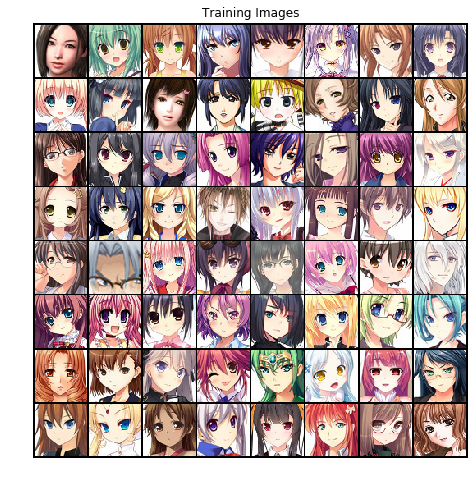

In [29]:
#transforming all images to required format
dataset=dset.ImageFolder(root=location
                        ,transform=transforms.Compose([transforms.Resize(image_size)
                                                      ,transforms.CenterCrop(image_size)
                                                      ,transforms.ToTensor()
                                                      ,transforms.Normalize((.5,.5,.5),(.5,.5,.5))]))
#dataloader
dataloader=torch.utils.data.DataLoader(dataset,batch_size=batch_size,shuffle=True,num_workers=workers)

#choosing device cpu or gpu
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

#Weight Initialization
we will randomly initialize weights according in  normal distribution with mean=0 and standard deviation=.2

In [0]:
#lets make a function we will call later for discriminator or generator function to initilize their weights 
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
  

#The Generator

In [0]:
class generator(nn.Module):
  def __init__(self,ngpu):
    super(generator,self).__init__()
    self.ngpu=ngpu
    self.main=nn.Sequential(
        nn.ConvTranspose2d(nz,ngf*8,4,1,0,bias=False),
        nn.BatchNorm2d(ngf*8),
        nn.ReLU(True),
    
        nn.ConvTranspose2d(ngf*8,ngf*4,4,2,1,bias=False),
        nn.BatchNorm2d(ngf*4),
        nn.ReLU(True),
    
        nn.ConvTranspose2d(ngf*4,ngf*2,4,2,1,bias=False),
        nn.BatchNorm2d(ngf*2),
        nn.ReLU(True),
        
        nn.ConvTranspose2d(ngf*2,ngf,4,2,1,bias=True),
        nn.BatchNorm2d(ngf),
        nn.ReLU(True),
        
        nn.ConvTranspose2d(ngf,nc,4,2,1,bias=True),
        nn.Tanh()
    
   
        
    )
  def forward(self,input):
    return self.main(input)
  

In [12]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
netG = generator(ngpu).to(device)
if (device.type=='cuda') and (ngpu>1):
  netG=nn.DataParallel(netG,list(range(ngpu)))
  
netG.apply(weights_init)
  
print(netG)

generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): Tanh()
  )
)


#The  Discriminator

In [0]:
class discriminator(nn.Module):
  def __init__(self):
    super(discriminator,self).__init__()
    self.ngpu=ngpu
    self.main=nn.Sequential(
        nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
    
        nn.Conv2d(ndf,ndf*2,4,2,1,bias=False),
        nn.BatchNorm2d(ndf*2),
        nn.LeakyReLU(.2,inplace=True),
        
        nn.Conv2d(ndf*2,ndf*4,4,2,1,bias=False),
        nn.BatchNorm2d(ndf*4),
        nn.LeakyReLU(.2,inplace=True),
    
        nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf * 8),
        nn.LeakyReLU(0.2, inplace=True),
        
        nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
        nn.Sigmoid())
  def forward(self,input):
      return self.main(input)

In [14]:
# Create the Discriminator
netD = discriminator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


##Loss function and optimiser

In [0]:
loss_function=nn.BCELoss() #binary cross entropy loss

fix_noise=torch.randn(64,nz,1,1,device=device)

realL=1
fakeL=0

optim_D=optim.Adam(netD.parameters(),lr=lr,betas=(B1,.999))
optim_G=optim.Adam(netG.parameters(),lr=lr,betas=(B1,.999))

In [32]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), realL, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = loss_function(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fakeL)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = loss_function(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optim_D.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(realL)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = loss_function(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optim_G.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fix_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/50][0/169]	Loss_D: 0.5979	Loss_G: 3.8579	D(x): 0.6953	D(G(z)): 0.0948 / 0.0297
[0/50][50/169]	Loss_D: 0.6641	Loss_G: 5.1616	D(x): 0.7280	D(G(z)): 0.2093 / 0.0101
[0/50][100/169]	Loss_D: 0.4719	Loss_G: 4.7484	D(x): 0.7556	D(G(z)): 0.0881 / 0.0118
[0/50][150/169]	Loss_D: 0.6690	Loss_G: 3.3709	D(x): 0.6793	D(G(z)): 0.1146 / 0.0528
[1/50][0/169]	Loss_D: 0.5994	Loss_G: 3.7810	D(x): 0.7174	D(G(z)): 0.1513 / 0.0351
[1/50][50/169]	Loss_D: 0.5157	Loss_G: 5.0030	D(x): 0.7148	D(G(z)): 0.0386 / 0.0107
[1/50][100/169]	Loss_D: 0.9421	Loss_G: 9.0375	D(x): 0.5363	D(G(z)): 0.0014 / 0.0003
[1/50][150/169]	Loss_D: 0.4795	Loss_G: 5.4803	D(x): 0.8687	D(G(z)): 0.2390 / 0.0067
[2/50][0/169]	Loss_D: 0.4714	Loss_G: 4.7540	D(x): 0.7866	D(G(z)): 0.1448 / 0.0132
[2/50][50/169]	Loss_D: 0.3028	Loss_G: 4.0422	D(x): 0.8765	D(G(z)): 0.1297 / 0.0298
[2/50][100/169]	Loss_D: 0.4726	Loss_G: 5.6545	D(x): 0.8470	D(G(z)): 0.2118 / 0.0071
[2/50][150/169]	Loss_D: 1.1481	Loss_G: 4.8872	D(x): 0.4459	

In [0]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [0]:
plt.imshow(img_list[3].cpu().detach().numpy().T)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


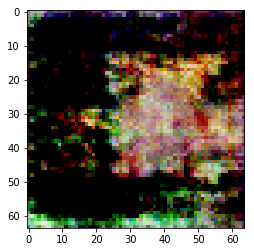

In [19]:
plt.imshow(netG(noise)[2].detach().cpu().numpy().T)

In [43]:
import matplotlib

matplotlib.image.imsave('name.png', netG(noise)[0].detach().cpu().numpy().T)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
